In [6]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import scipy 
from sklearn.preprocessing import StandardScaler

plt.style.use('ggplot')
# pd.set_option('max_columns', 200)



In [7]:
# Read data
data_df = pd.read_csv('data/data.csv')

In [18]:
data_df.columns

Index(['valence', 'year', 'acousticness', 'artists', 'danceability',
       'duration_ms', 'energy', 'explicit', 'id', 'instrumentalness', 'key',
       'liveness', 'loudness', 'mode', 'name', 'popularity', 'release_date',
       'speechiness', 'tempo'],
      dtype='object')

In [4]:
data_df.dtypes

valence             float64
year                  int64
acousticness        float64
artists              object
danceability        float64
duration_ms           int64
energy              float64
explicit              int64
id                   object
instrumentalness    float64
key                   int64
liveness            float64
loudness            float64
mode                  int64
name                 object
popularity            int64
release_date         object
speechiness         float64
tempo               float64
dtype: object

In [5]:
data_df.describe()

,valence,year,acousticness,danceability,duration_ms,energy,explicit,instrumentalness,key,liveness,loudness,mode,popularity,speechiness,tempo
count,170653.000000,170653.000000,170653.000000,170653.000000,1.706530e+05,170653.000000,170653.000000,170653.000000,170653.000000,170653.000000,170653.000000,170653.000000,170653.000000,170653.000000,170653.000000
mean,0.528587,1976.787241,0.502115,0.537396,2.309483e+05,0.482389,0.084575,0.167010,5.199844,0.205839,-11.467990,0.706902,31.431794,0.098393,116.861590
std,0.263171,25.917853,0.376032,0.176138,1.261184e+05,0.267646,0.278249,0.313475,3.515094,0.174805,5.697943,0.455184,21.826615,0.162740,30.708533
min,0.000000,1921.000000,0.000000,0.000000,5.108000e+03,0.000000,0.000000,0.000000,0.000000,0.000000,-60.000000,0.000000,0.000000,0.000000,0.000000
25%,0.317000,1956.000000,0.102000,0.415000,1.698270e+05,0.255000,0.000000,0.000000,2.000000,0.098800,-14.615000,0.000000,11.000000,0.034900,93.421000
50%,0.540000,1977.000000,0.516000,0.548000,2.074670e+05,0.471000,0.000000,0.000216,5.000000,0.136000,-10.580000,1.000000,33.000000,0.045000,114.729000
75%,0.747000,1999.000000,0.893000,0.668000,2.624000e+05,0.703000,0.000000,0.102000,8.000000,0.261000,-7.183000,1.000000,48.000000,0.075600,135.537000
max,1.000000,2020.000000,0.996000,0.988000,5.403500e+06,1.000000,1.000000,1.000000,11.000000,1.000000,3.855000,1.000000,100.000000,0.970000,243.507000


In [6]:
data_df.head(5)

,valence,year,acousticness,artists,danceability,duration_ms,energy,explicit,id,instrumentalness,key,liveness,loudness,mode,name,popularity,release_date,speechiness,tempo
0,0.0594,1921,0.982,"['Sergei Rachmaninoff', 'James Levine', 'Berli...",0.279,831667,0.211,0,4BJqT0PrAfrxzMOxytFOIz,0.878000,10,0.665,-20.096,1,"Piano Concerto No. 3 in D Minor, Op. 30: III. ...",4,1921,0.0366,80.954
1,0.9630,1921,0.732,['Dennis Day'],0.819,180533,0.341,0,7xPhfUan2yNtyFG0cUWkt8,0.000000,7,0.160,-12.441,1,Clancy Lowered the Boom,5,1921,0.4150,60.936
2,0.0394,1921,0.961,['KHP Kridhamardawa Karaton Ngayogyakarta Hadi...,0.328,500062,0.166,0,1o6I8BglA6ylDMrIELygv1,0.913000,3,0.101,-14.850,1,Gati Bali,5,1921,0.0339,110.339
3,0.1650,1921,0.967,['Frank Parker'],0.275,210000,0.309,0,3ftBPsC5vPBKxYSee08FDH,0.000028,5,0.381,-9.316,1,Danny Boy,3,1921,0.0354,100.109
4,0.2530,1921,0.957,['Phil Regan'],0.418,166693,0.193,0,4d6HGyGT8e121BsdKmw9v6,0.000002,3,0.229,-10.096,1,When Irish Eyes Are Smiling,2,1921,0.0380,101.665


In [7]:
# Remove id column
data_df = data_df.drop(columns=['id'])

In [8]:
data_df.columns

Index(['valence', 'year', 'acousticness', 'artists', 'danceability',
       'duration_ms', 'energy', 'explicit', 'instrumentalness', 'key',
       'liveness', 'loudness', 'mode', 'name', 'popularity', 'release_date',
       'speechiness', 'tempo'],
      dtype='object')

# valence
In music, valence refers to the emotional value or mood a piece of music conveys — specifically, whether it feels positive or negative.

High valence music sounds happy, joyful, uplifting, or pleasant. Think major keys, upbeat tempos, and bright melodies.

Low valence music feels sad, somber, moody, or tense. These often involve minor keys, slower tempos, and darker tones.



In [9]:
data_df.valence.describe()

count    170653.000000
mean          0.528587
std           0.263171
min           0.000000
25%           0.317000
50%           0.540000
75%           0.747000
max           1.000000
Name: valence, dtype: float64

<Axes: ylabel='Frequency'>

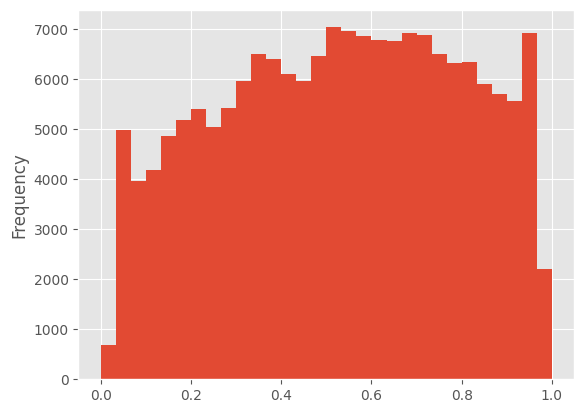

In [10]:
data_df.valence.plot(kind='hist', bins=30)

<Axes: ylabel='Density'>

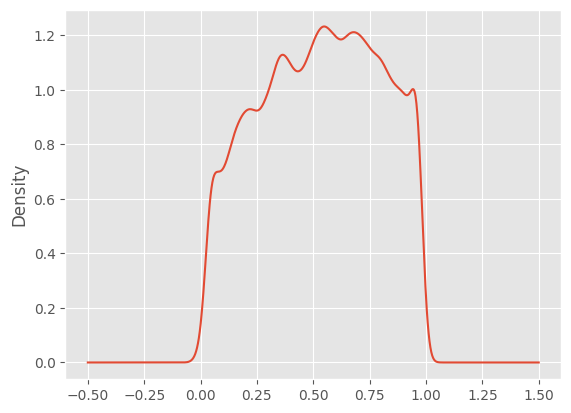

In [11]:
data_df.valence.plot(kind='kde')

<Axes: >

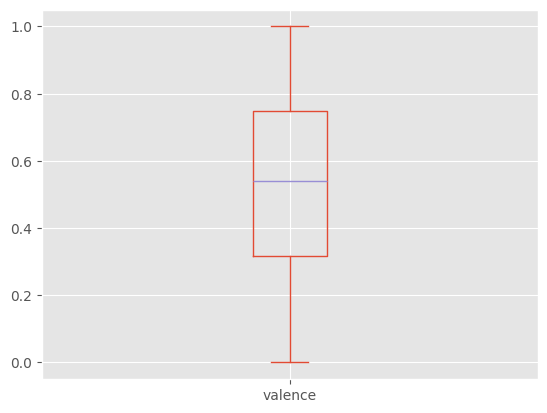

In [6]:
data_df.valence.plot(kind='box')

In [12]:
data_df.valence.isna().sum()

np.int64(0)

In [13]:
# Sad Music
len(data_df.query('valence < 0.5')) / len(data_df)

0.45152443848042517

In [14]:
# Happy music
len(data_df.query('valence > 0.5')) / len(data_df)

0.5473973501784323

Text(0.5, 1.0, 'Count of Songs per Decade')

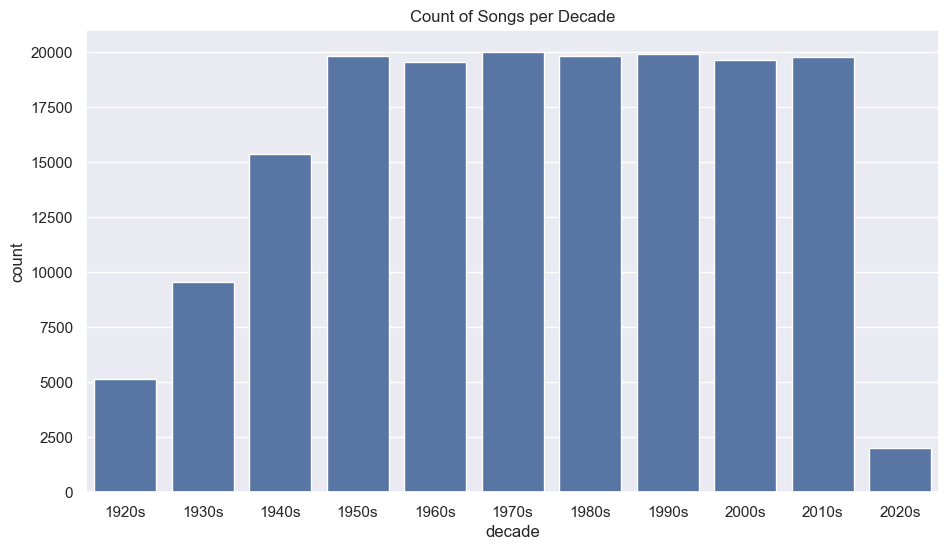

In [193]:
def get_decade(year):
    period_start = int(year/10) * 10
    decade = '{}s'.format(period_start)
    return decade

data_df['decade'] = data_df['year'].apply(get_decade)

sns.set_color_codes('deep')
sns.countplot(x='decade', data=data_df)
plt.title('Count of Songs per Decade')

# year

In [38]:
data_df.year.dtype

dtype('int64')

In [40]:
data_df.year.isna().sum()

np.int64(0)

<Axes: xlabel='year'>

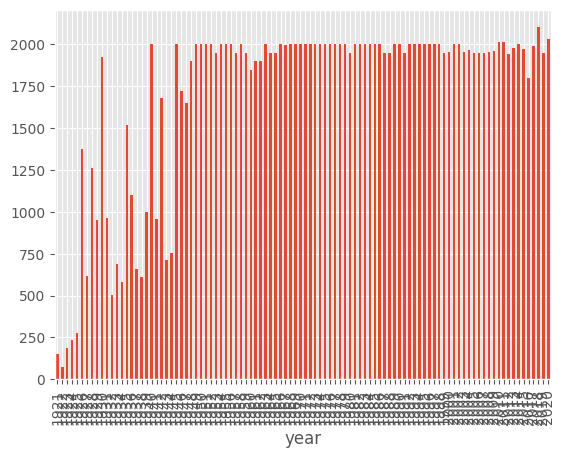

In [37]:
data_df.year.value_counts().sort_index().plot(kind='bar')

# release_date

In [48]:
data_df.dtypes

valence             float64
year                  int64
acousticness        float64
artists              object
danceability        float64
duration_ms           int64
energy              float64
explicit              int64
id                   object
instrumentalness    float64
key                   int64
liveness            float64
loudness            float64
mode                  int64
name                 object
popularity            int64
release_date         object
speechiness         float64
tempo               float64
dtype: object

In [55]:
data_df.release_date = pd.to_datetime(data_df.release_date, format='mixed')


0        1921-01-01
1        1921-01-01
2        1921-01-01
3        1921-01-01
4        1921-01-01
            ...    
170648   2020-05-29
170649   2020-10-23
170650   2020-11-03
170651   2020-01-17
170652   2020-10-16
Name: release_date, Length: 170653, dtype: datetime64[ns]

In [73]:
data_df.release_date = pd.to_datetime(data_df.release_date).dt.year

In [75]:
data_df.query('year != release_date')
# So we can remove release_date column

,valence,year,acousticness,artists,danceability,duration_ms,energy,explicit,id,instrumentalness,key,liveness,loudness,mode,name,popularity,release_date,speechiness,tempo


In [79]:
data_df = data_df.drop('release_date', axis=1)

In [80]:
data_df.columns

Index(['valence', 'year', 'acousticness', 'artists', 'danceability',
       'duration_ms', 'energy', 'explicit', 'id', 'instrumentalness', 'key',
       'liveness', 'loudness', 'mode', 'name', 'popularity', 'speechiness',
       'tempo'],
      dtype='object')

# acousticness
Acousticness in music refers to a measure of how acoustic a track is — in other words, how likely it is that the song uses acoustic instruments (like guitars, pianos, drums, etc.) rather than electronic or synthesized sounds.

🎵 In practical terms:
A high acousticness score (close to 1.0) means the song is mostly or entirely acoustic.

A low score (close to 0.0) suggests it's primarily electronic or synthesized.

In [82]:
data_df.acousticness.dtype

dtype('float64')

In [83]:
data_df.acousticness.isna().sum()

np.int64(0)

In [86]:
data_df['acousticness'].describe()

count    170653.000000
mean          0.502115
std           0.376032
min           0.000000
25%           0.102000
50%           0.516000
75%           0.893000
max           0.996000
Name: acousticness, dtype: float64

<Axes: ylabel='Frequency'>

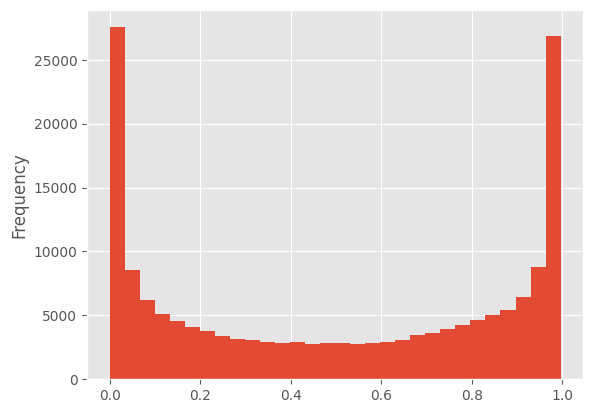

In [18]:
data_df.acousticness.plot(kind='hist', bins=30)

<Axes: ylabel='Density'>

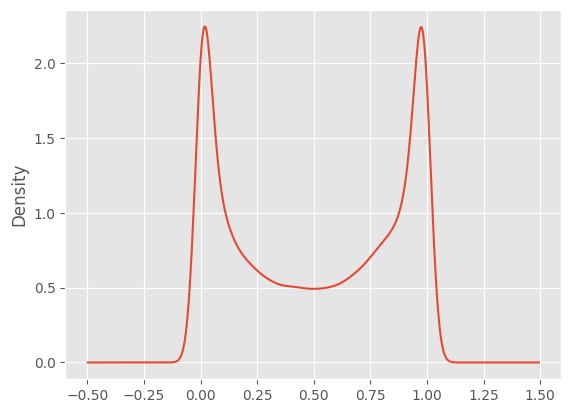

In [7]:
data_df.acousticness.plot(kind='kde')

<Axes: xlabel='acousticness', ylabel='Count'>

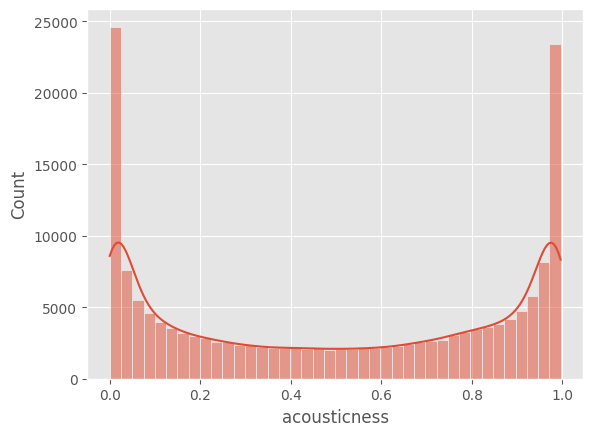

In [20]:
sns.histplot(data_df['acousticness'], bins=40, kde=True)

<Axes: >

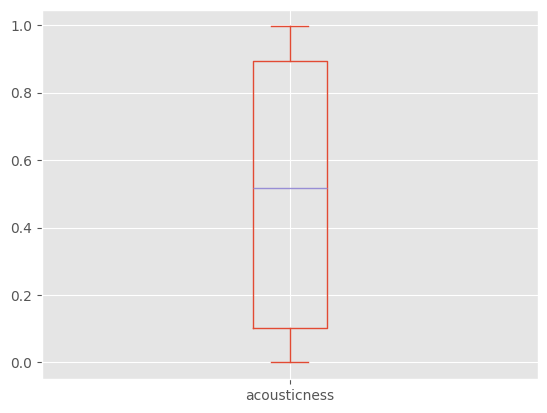

In [8]:
data_df.acousticness.plot(kind='box')

In [21]:
data_df.shape

(170653, 19)

In [32]:
data_selected_df = data_df[['valence', 'acousticness', 'danceability',
       'duration_ms', 'energy', 'explicit', 'instrumentalness', 'key',
       'liveness', 'loudness', 'mode', 'popularity',
       'speechiness', 'tempo']]
X_train = data_selected_df[:160_000]
X_test = data_selected_df[160_000:]

In [33]:

scaler = StandardScaler()


# 3. Fit the scaler on training data and transform
X_train_scaled = scaler.fit_transform(X_train)

# 4. Use the same scaler to transform test data
X_test_scaled = scaler.transform(X_test)

In [35]:
X_train_scaled

array([[-1.78265003,  1.24499926, -1.4646177 , ..., -1.21724241,
        -0.37952525, -1.16173954],
       [ 1.64850729,  0.58139905,  1.60283942, ..., -1.1723095 ,
         1.89967118, -1.81308385],
       [-1.85859419,  1.18925685, -1.18627437, ..., -1.1723095 ,
        -0.39578802, -0.20561243],
       ...,
       [ 1.09031768,  0.27614296,  1.20520609, ..., -0.45338291,
        -0.28616493, -0.02941953],
       [ 0.38783417, -0.62900773, -0.1069839 , ..., -0.45338291,
        -0.44698561, -1.41065472],
       [ 0.24733747,  0.83091273, -0.14106676, ..., -0.63311456,
         0.59864996,  0.56553654]], shape=(160000, 14))

# artists

In [16]:
data_df['artists'].head(5)

0    ['Sergei Rachmaninoff', 'James Levine', 'Berli...
1                                       ['Dennis Day']
2    ['KHP Kridhamardawa Karaton Ngayogyakarta Hadi...
3                                     ['Frank Parker']
4                                       ['Phil Regan']
Name: artists, dtype: object

In [80]:
# Check name of the columns
data_df.columns

# If renaming is required for columns
# data_df = data_df.rename(columns={
#     'old_name': 'new_name',
# })


Index(['valence', 'year', 'acousticness', 'artists', 'danceability',
       'duration_ms', 'energy', 'explicit', 'id', 'instrumentalness', 'key',
       'liveness', 'loudness', 'mode', 'name', 'popularity', 'release_date',
       'speechiness', 'tempo'],
      dtype='object')

In [83]:
# Identify missing or Null values
data_df.isna().sum() # Good 

valence             0
year                0
acousticness        0
artists             0
danceability        0
duration_ms         0
energy              0
explicit            0
id                  0
instrumentalness    0
key                 0
liveness            0
loudness            0
mode                0
name                0
popularity          0
release_date        0
speechiness         0
tempo               0
dtype: int64

In [87]:
# Check for duplicates
data_df.loc[data_df.duplicated()]

,valence,year,acousticness,artists,danceability,duration_ms,energy,explicit,id,instrumentalness,key,liveness,loudness,mode,name,popularity,release_date,speechiness,tempo


In [91]:
# Check for duplicates for a specific column
data_df.loc[data_df.duplicated(subset=['id'])]


,valence,year,acousticness,artists,danceability,duration_ms,energy,explicit,id,instrumentalness,key,liveness,loudness,mode,name,popularity,release_date,speechiness,tempo


In [98]:
# drop duplicates
data_df = data_df.drop_duplicates(subset=['id', 'energy'], keep='first').copy()
data_df.head()

,valence,year,acousticness,artists,danceability,duration_ms,energy,explicit,id,instrumentalness,key,liveness,loudness,mode,name,popularity,release_date,speechiness,tempo
0,0.0594,1921,0.982,"['Sergei Rachmaninoff', 'James Levine', 'Berli...",0.279,831667,0.211,0,4BJqT0PrAfrxzMOxytFOIz,0.878000,10,0.665,-20.096,1,"Piano Concerto No. 3 in D Minor, Op. 30: III. ...",4,1921-01-01,0.0366,80.954
1,0.9630,1921,0.732,['Dennis Day'],0.819,180533,0.341,0,7xPhfUan2yNtyFG0cUWkt8,0.000000,7,0.160,-12.441,1,Clancy Lowered the Boom,5,1921-01-01,0.4150,60.936
2,0.0394,1921,0.961,['KHP Kridhamardawa Karaton Ngayogyakarta Hadi...,0.328,500062,0.166,0,1o6I8BglA6ylDMrIELygv1,0.913000,3,0.101,-14.850,1,Gati Bali,5,1921-01-01,0.0339,110.339
3,0.1650,1921,0.967,['Frank Parker'],0.275,210000,0.309,0,3ftBPsC5vPBKxYSee08FDH,0.000028,5,0.381,-9.316,1,Danny Boy,3,1921-01-01,0.0354,100.109
4,0.2530,1921,0.957,['Phil Regan'],0.418,166693,0.193,0,4d6HGyGT8e121BsdKmw9v6,0.000002,3,0.229,-10.096,1,When Irish Eyes Are Smiling,2,1921-01-01,0.0380,101.665


In [106]:
# Another way to drop duplicates
data_df = data_df.loc[~data_df.duplicated(subset=['id', 'energy'])].reset_index(drop=True).copy()

# danceability 
Danceability in music refers to how suitable a track is for dancing. It's a measurement of a song’s rhythm, tempo, beat strength, and overall groove, and how easily people can move to it.

More specifically:
Danceability considers:

Tempo (BPM) – faster tempos are often more danceable.

Rhythmic stability – a steady, predictable beat makes dancing easier.

Beat strength – how clearly the beat is defined.

Energy and groove – how much the music makes you want to move.

Platforms like Spotify assign a danceability score from 0.0 to 1.0:

A value of 0.0 means not danceable at all (e.g., a slow, arrhythmic classical piece).

A value of 1.0 means very danceable (e.g., EDM, pop, funk).

In [37]:
data_df["danceability"].describe()

count    170653.000000
mean          0.537396
std           0.176138
min           0.000000
25%           0.415000
50%           0.548000
75%           0.668000
max           0.988000
Name: danceability, dtype: float64

<Axes: xlabel='danceability', ylabel='Count'>

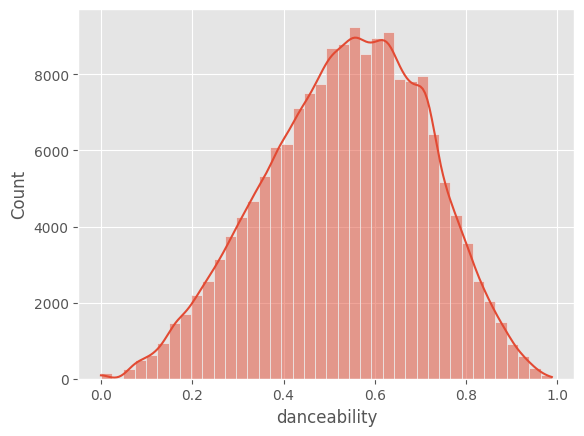

In [38]:
sns.histplot(data_df["danceability"], bins=40, kde=True)

In [43]:
data_df.query('danceability > 0.9 ').name.head(5).to_list()

['Breakaway',
 'Sweet Georgia Brown',
 'No Me Llores - Instrumental (Remasterizado)',
 'Trago Amargo - Instrumental (Remasterizado)',
 'La Bataclana - Instrumental (Remasterizado)']

In [44]:
data_df.query('danceability < 0.1 ').name.head(5).to_list()

['No. 14, Vocalise',
 'No. 14, Vocalise',
 'La Mina del Ford - Remasterizado',
 'Oh Mujer Mujer - Remasterizado',
 'Santa Claus Is Coming To Town']

In [46]:
data_df["danceability"].isna().sum()

np.int64(0)

In [50]:
data_df["danceability"].duplicated().sum()

np.int64(169413)

# duration_ms

In [68]:
data_df["duration_ms"].describe()

count    1.706530e+05
mean     2.309483e+05
std      1.261184e+05
min      5.108000e+03
25%      1.698270e+05
50%      2.074670e+05
75%      2.624000e+05
max      5.403500e+06
Name: duration_ms, dtype: float64

<Axes: xlabel='duration_ms', ylabel='Count'>

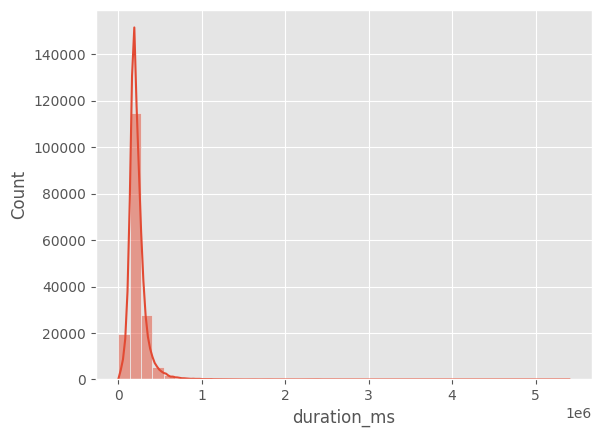

In [69]:
sns.histplot(data_df["duration_ms"], bins=40, kde=True)

In [89]:
data_df = data_df.query('duration_ms > 50_000 & duration_ms < 350_000').copy()

<Axes: xlabel='duration_ms', ylabel='Count'>

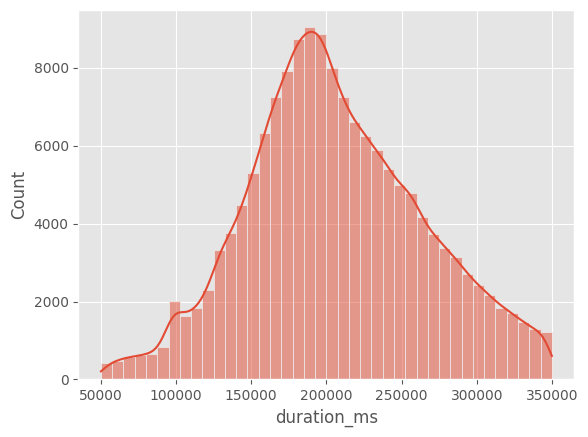

In [90]:
sns.histplot(data_df["duration_ms"], bins=40, kde=True)

<Axes: >

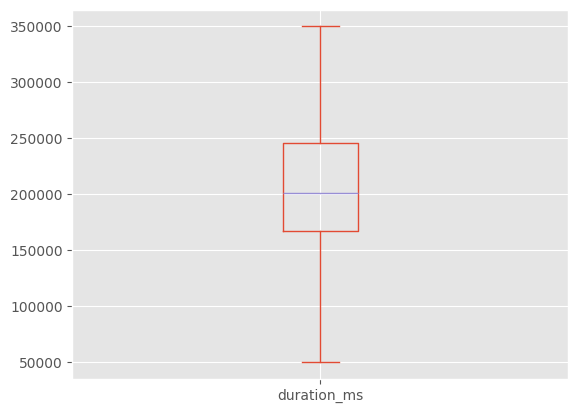

In [91]:
data_df["duration_ms"].plot(kind='box')

In [98]:
data_df["duration_ms"].isna().sum()

np.int64(0)

In [99]:
data_df["duration_ms"].duplicated().sum()

np.int64(114379)

# energy
Energy in music refers to the perceived intensity and activity level of a track. It's all about how lively, dynamic, and powerful the song feels — kind of like the musical equivalent of caffeine ☕️.

What contributes to a song’s energy?
Several elements combine to give a track high or low energy:

Tempo – faster = usually more energetic.

Loudness – higher volume levels feel more intense.

Dynamics – how much the song changes and builds.

Instrumentation – distorted guitars, heavy drums, or synths can increase energy.

Rhythmic drive – punchy, consistent beats give a track urgency.

Vocal delivery – aggressive or animated vocals = higher energy.

Spotify’s "Energy" Score:
Like danceability, Spotify assigns an energy score from 0.0 to 1.0:

0.0 = very calm, mellow, or ambient (e.g., lo-fi, acoustic ballads).

1.0 = extremely intense and loud (e.g., hard rock, high-BPM EDM).

In [93]:
data_df["energy"].describe()

count    154690.000000
mean          0.487759
std           0.266557
min           0.000000
25%           0.262000
50%           0.478000
75%           0.708000
max           1.000000
Name: energy, dtype: float64

<Axes: xlabel='energy', ylabel='Count'>

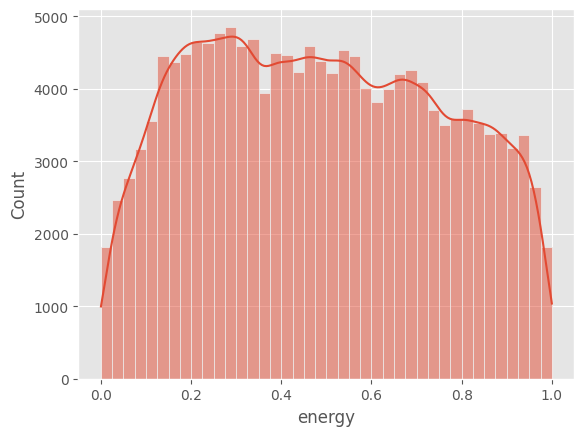

In [94]:
sns.histplot(data_df["energy"], bins=40, kde=True)

In [96]:
data_df.query('energy > 0.99').name.head(5).to_list()

['Weck Worscht & OI!',
 "Applause; Benny Goodman's 'No Encore' Announcement - Live",
 'Valentines Day',
 'Friday On My Mind',
 'Atomic Punk - 2015 Remaster']

In [97]:
data_df.query('energy > 0.1').name.head(5).to_list()

['Clancy Lowered the Boom',
 'Danny Boy',
 'When Irish Eyes Are Smiling',
 'The Wearing of the Green',
 'La Mañanita - Remasterizado']

In [101]:
data_df["energy"].duplicated().sum()

np.int64(152429)

In [102]:
data_df["duration_ms"].isna().sum()

np.int64(0)

# explicit
Explicit in music means that a song contains strong language, sexual content, or references to violence, drugs, or other adult themes that may not be suitable for children or general audiences.

What qualifies a song as explicit?
A track is typically labeled explicit if it includes:

Profanity (e.g., the F-word or other swear words)

Graphic sexual references

Drug or alcohol use

Violent or offensive content

You’ll usually see a “[E]” label next to explicit tracks on platforms like Spotify, Apple Music, or YouTube.

In [104]:
data_df["explicit"].describe()

count    154690.000000
mean          0.090109
std           0.286339
min           0.000000
25%           0.000000
50%           0.000000
75%           0.000000
max           1.000000
Name: explicit, dtype: float64

In [111]:
len(data_df.query('explicit == 1')) / len(data_df)

0.09010925075958369

In [112]:
len(data_df.query('explicit == 0')) / len(data_df)

0.9098907492404164

In [113]:
data_df["explicit"].isna().sum()

np.int64(0)

# instrumentalness
Instrumentalness in music measures how likely it is that a track contains no vocals — basically, how purely instrumental the song is.

Spotify defines "instrumentalness" as:
A confidence measure from 0.0 to 1.0. The closer the value is to 1.0, the more likely it is that the track is instrumental (no singing or speech).

Key points:
0.0 = definitely has vocals.

1.0 = highly likely to be fully instrumental.

Even tracks with non-lyrical vocal sounds (like humming, oohs/aahs, or samples) can lower the instrumentalness score.

In [116]:
data_df["instrumentalness"].describe()

count    154690.000000
mean          0.150507
std           0.301557
min           0.000000
25%           0.000000
50%           0.000116
75%           0.052100
max           1.000000
Name: instrumentalness, dtype: float64

<Axes: xlabel='instrumentalness', ylabel='Count'>

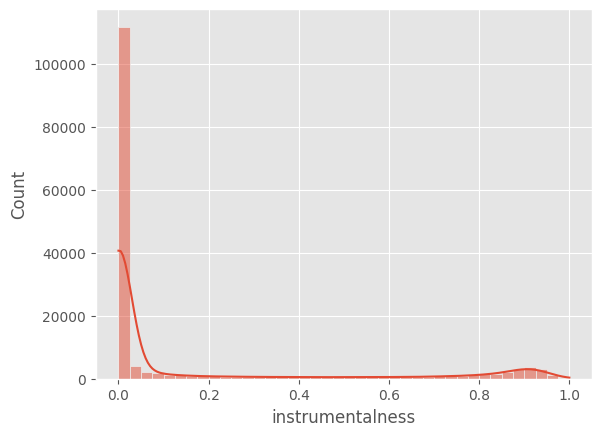

In [121]:
sns.histplot(data_df["instrumentalness"], bins=40, kde=True)

<Axes: >

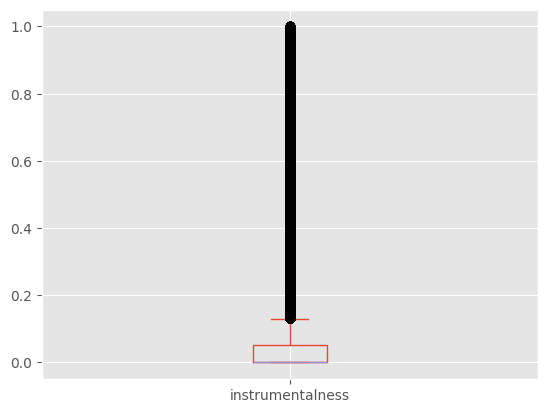

In [120]:
data_df["instrumentalness"].plot(kind='box')

In [122]:
data_df["instrumentalness"].isna().sum()

np.int64(0)

In [127]:
data_df.columns

Index(['valence', 'year', 'acousticness', 'artists', 'danceability',
       'duration_ms', 'energy', 'explicit', 'id', 'instrumentalness', 'key',
       'liveness', 'loudness', 'mode', 'name', 'popularity', 'release_date',
       'speechiness', 'tempo'],
      dtype='object')

# key
In music, the key of a song refers to the group of notes (scale) that the song is based on, and it tells you the tonal center or “home” note around which the music revolves.

🔑 In simple terms:
The key is like the musical “mood setting”. It defines:

What notes sound “right” together

Which chord feels like “home” (the tonic)

For example:

A song in the key of C major uses mostly notes from the C major scale (C, D, E, F, G, A, B)

A song in the key of A minor uses the A minor scale (A, B, C, D, E, F, G)

🎶 Major vs Minor:
Major keys tend to sound happy, bright, or uplifting

Minor keys tend to sound sad, dark, or emotional

Example:

🎵 “Happy” by Pharrell – key of F minor (but upbeat feel)

🎵 “Let It Be” by The Beatles – key of C major (gentle, hopeful)

Spotify & Keys:
Spotify gives songs a key value from 0 to 11, representing the 12 musical keys (C to B), plus a mode:

Mode 1 = Major, Mode 0 = Minor

Key Value	Key
0	C
1	C♯/D♭
2	D
3	D♯/E♭
4	E
5	F
6	F♯/G♭
7	G
8	G♯/A♭
9	A
10	A♯/B♭
11	B
So a song with key = 0 and mode = 1 is C major, while key = 9 and mode = 0 is A minor.

In [125]:
data_df["key"].describe()

count    154690.000000
mean          5.204254
std           3.513507
min           0.000000
25%           2.000000
50%           5.000000
75%           8.000000
max          11.000000
Name: key, dtype: float64

<Axes: xlabel='key'>

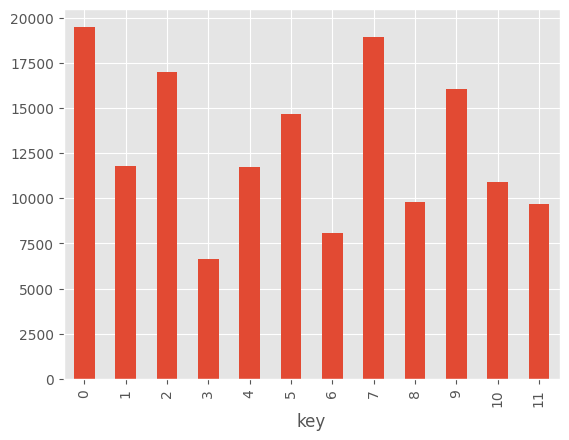

In [133]:
data_df["key"].value_counts().sort_index().plot(kind='bar')

In [134]:
data_df["key"].isna().sum()

np.int64(0)

# liveness
Liveness in music is a measure of how likely it is that a track was recorded live in front of an audience.

🎤 What does “liveness” capture?
It detects audible signs of a live performance, such as:

Audience noise (cheering, clapping)

Room ambiance or reverb

Live acoustics (versus a polished studio sound)

📊 Spotify’s Liveness Score:
Spotify assigns a value between 0.0 and 1.0:

0.0 = definitely studio-recorded

1.0 = very likely live performance

In [136]:
data_df["liveness"].describe()

count    154690.000000
mean          0.202799
std           0.168283
min           0.000000
25%           0.099000
50%           0.136000
75%           0.259000
max           1.000000
Name: liveness, dtype: float64

In [137]:
data_df["liveness"].describe()

count    154690.000000
mean          0.202799
std           0.168283
min           0.000000
25%           0.099000
50%           0.136000
75%           0.259000
max           1.000000
Name: liveness, dtype: float64

<Axes: xlabel='liveness', ylabel='Count'>

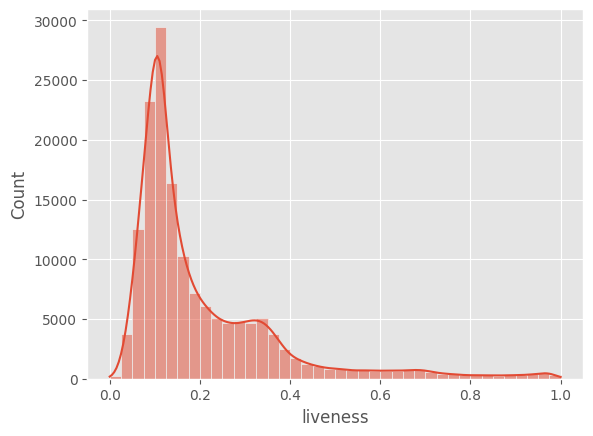

In [138]:
sns.histplot(data_df["liveness"], bins=40, kde=True)

<Axes: >

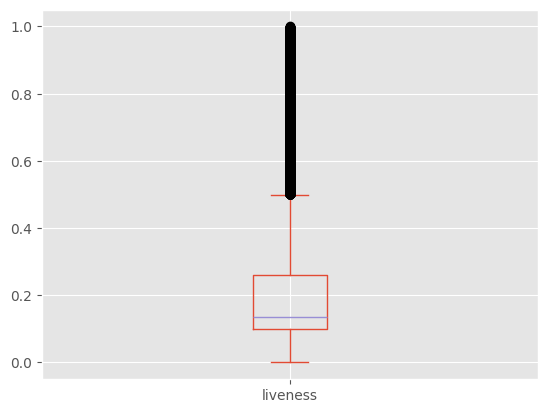

In [139]:
data_df["liveness"].plot(kind='box')

# loudness

Loudness in music refers to the perceived volume or intensity of a track, measured in decibels (dB). It’s not just about how loud you set your speakers — it's about how loud the track was mastered to sound.

📉 Spotify’s Loudness Metric:
Measured in decibels (dB).

Typically ranges from -60 dB to 0 dB.

Closer to 0 = louder.

Most commercial music falls between -12 dB and -4 dB.

📌 A track with loudness -5 dB is significantly louder than one at -12 dB.

In [140]:
data_df['loudness'].describe()

count    154690.000000
mean        -11.221328
std           5.586486
min         -60.000000
25%         -14.272000
50%         -10.348000
75%          -7.013250
max           3.855000
Name: loudness, dtype: float64

<Axes: xlabel='loudness', ylabel='Count'>

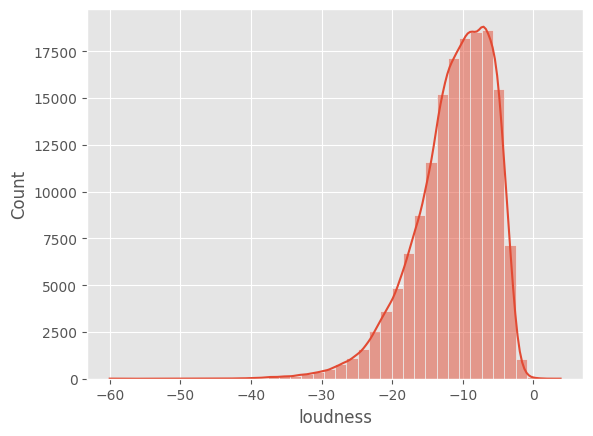

In [141]:
sns.histplot(data_df["loudness"], bins=40, kde=True)

<Axes: >

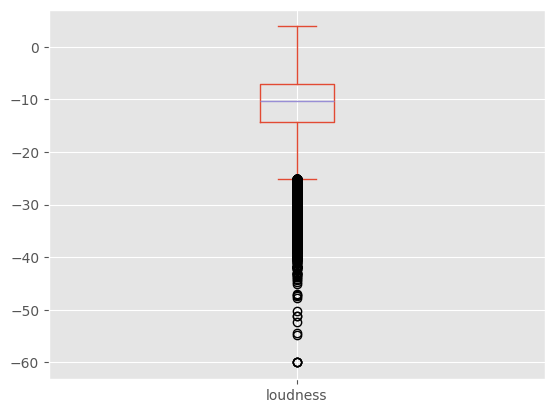

In [142]:
data_df['loudness'].plot(kind='box')

In [145]:
data_df = data_df.query('loudness <= 0')

<Axes: >

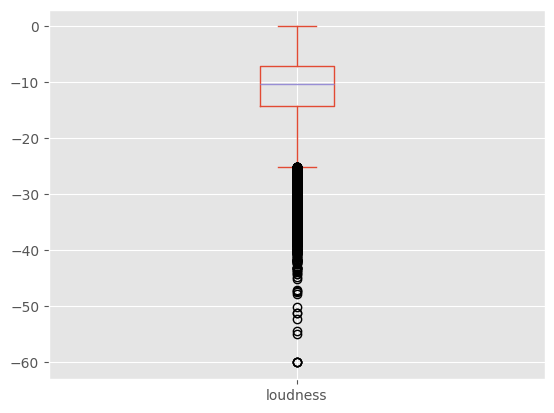

In [146]:
data_df['loudness'].plot(kind='box')

# Mode
In music, mode refers to the type of scale a song is based on, which gives it a particular emotional feel or character.

🎵 In modern music analysis (like Spotify's API):
The mode is a binary value:

1 → Major mode (generally sounds happy, bright, or uplifting)

0 → Minor mode (generally sounds sad, dark, or moody)

So a track with:

key = 0, mode = 1 → C Major

key = 9, mode = 0 → A Minor

In [149]:
data_df["mode"].describe()

count    154662.000000
mean          0.712205
std           0.452737
min           0.000000
25%           0.000000
50%           1.000000
75%           1.000000
max           1.000000
Name: mode, dtype: float64

<Axes: xlabel='mode'>

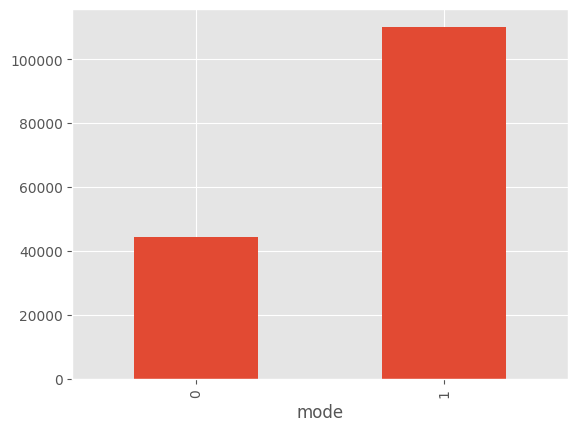

In [150]:
data_df["mode"].value_counts().sort_index().plot(kind='bar')

In [151]:
data_df["mode"].isna().sum()

np.int64(0)

# popularity
Popularity in music (especially on platforms like Spotify) is a numeric score from 0 to 100 that indicates how popular a song, artist, or album is — based on current streaming activity and listener engagement.

🔢 What does the popularity score mean?
Score	Meaning
90–100	Extremely popular (global hits)
70–89	Very popular (top charts or viral tracks)
40–69	Moderately popular
1–39	Niche or less-known
0	Basically no streams or new/obscure


In [155]:
data_df["popularity"].describe()

count    154662.000000
mean         32.026522
std          21.967614
min           0.000000
25%          12.000000
50%          34.000000
75%          49.000000
max         100.000000
Name: popularity, dtype: float64

<Axes: xlabel='popularity', ylabel='Count'>

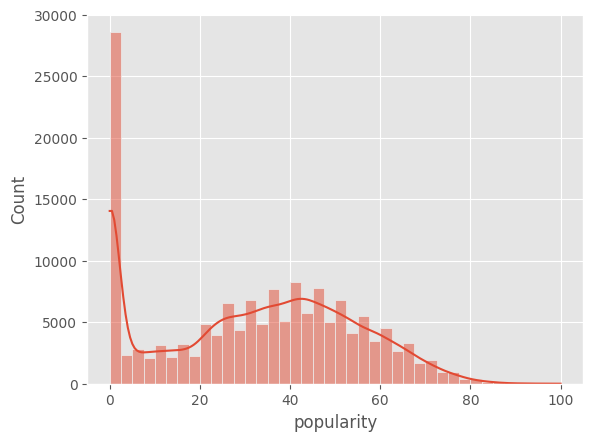

In [156]:
sns.histplot(data_df["popularity"], bins=40, kde=True)

<Axes: >

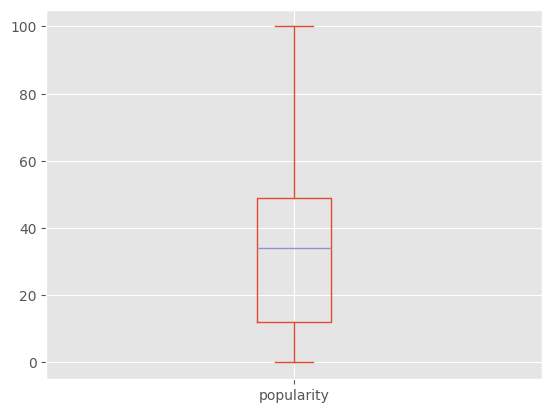

In [157]:
data_df["popularity"].plot(kind='box')

In [158]:
data_df["popularity"].isna().sum()

np.int64(0)

In [160]:
data_df.query('popularity == 100').name.head(5).to_list()

['Dakiti']

# release_date

<Axes: xlabel='release_date'>

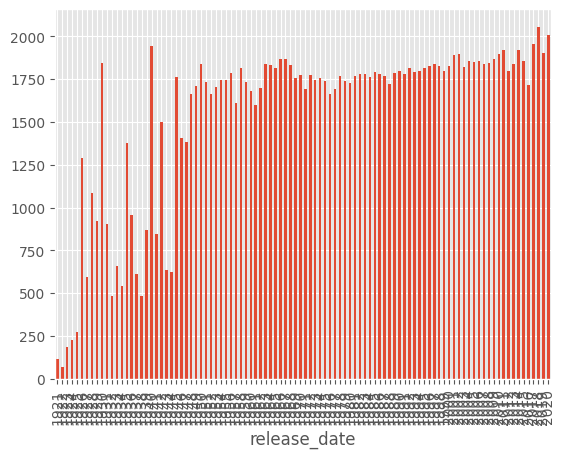

In [193]:
pd.to_datetime(data_df["release_date"], format='mixed').dt.year.value_counts().sort_index().plot(kind='bar')


# speechiness

Speechiness in music measures how much a track sounds like spoken words — basically, how speech-like the audio is.

🧠 Spotify defines speechiness as:
A value from 0.0 to 1.0 indicating the presence of spoken words in a track. The higher the value, the more likely the track is primarily speech (like a podcast or rap interlude).

📊 Value interpretation:
Speechiness Score	Meaning
0.00 – 0.33	Music with little or no speech (typical songs)
0.33 – 0.66	Mix of speech and music (e.g. some hip-hop, talky pop)
0.66 – 1.00	Mostly or fully spoken (e.g. podcasts, skits, speeches)


In [195]:
data_df["speechiness"].describe()

count    154662.000000
mean          0.099082
std           0.162961
min           0.000000
25%           0.034700
50%           0.045100
75%           0.077100
max           0.970000
Name: speechiness, dtype: float64

<Axes: xlabel='speechiness', ylabel='Count'>

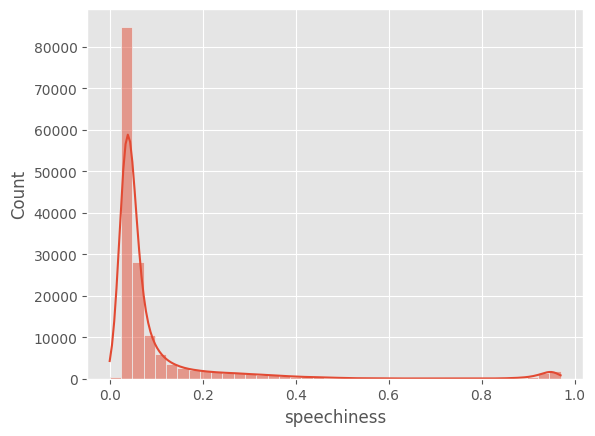

In [196]:
sns.histplot(data_df["speechiness"], bins=40, kde=True)

<Axes: >

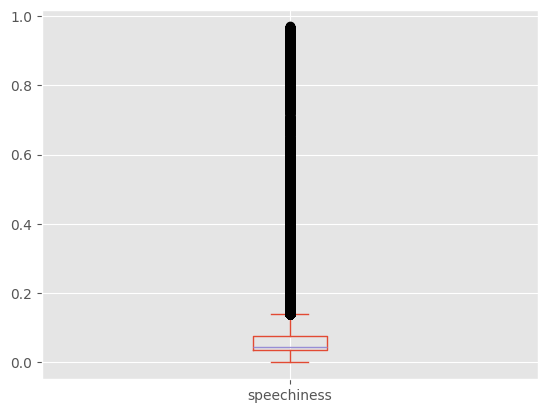

In [197]:
data_df["speechiness"].plot(kind='box')

In [198]:
data_df["speechiness"].isna().sum()

np.int64(0)

# tempo

Tempo in music refers to the speed or pace of a song, measured in beats per minute (BPM). It tells you how fast the beat is ticking in a track — essentially, how many beats occur in one minute.

🎵 Tempo (BPM) breakdown:
BPM Range	Style or Feel
40–60 BPM	Very slow (ballads, ambient, some jazz)
60–90 BPM	Chill, lo-fi, R&B, some hip-hop
90–110 BPM	Mid-tempo pop, relaxed dance
110–130 BPM	Upbeat pop, house, reggaeton
130–150 BPM	Fast electronic, techno, K-pop
150+ BPM	Hardcore EDM, drum & bass, metal
📊 Spotify's tempo feature:
It’s a float value indicating the estimated overall tempo of the track in BPM.

Extracted from audio analysis — not always perfect, especially for songs with tempo changes.

In [201]:
data_df["tempo"].describe()

count    154662.000000
mean        117.258535
std          30.787027
min           0.000000
25%          93.800250
50%         114.989000
75%         135.969750
max         243.507000
Name: tempo, dtype: float64

<Axes: >

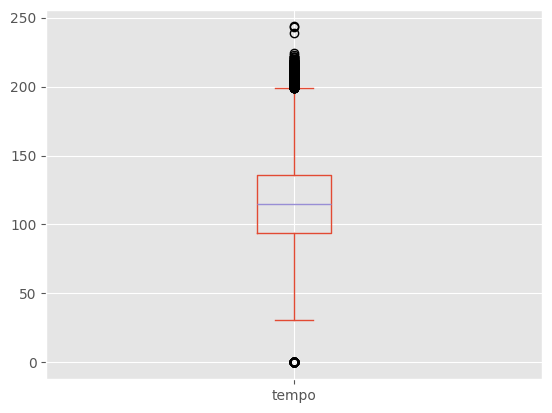

In [202]:
data_df["tempo"].plot(kind='box')

<Axes: xlabel='tempo', ylabel='Count'>

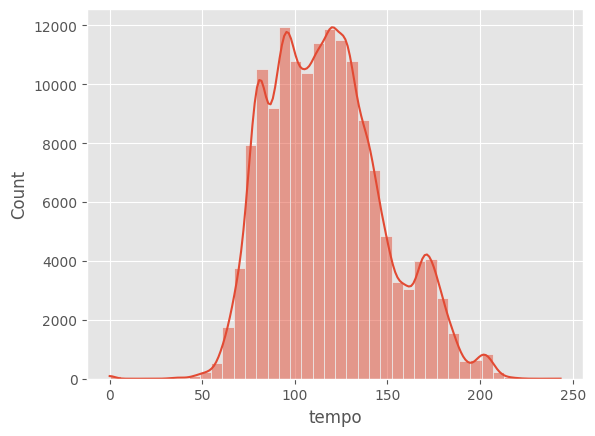

In [203]:
sns.histplot(data_df["tempo"], bins=40, kde=True)

# 3. Feature Understanding

# 4. Feature Relationship


In [204]:
data_df.columns

Index(['valence', 'year', 'acousticness', 'artists', 'danceability',
       'duration_ms', 'energy', 'explicit', 'id', 'instrumentalness', 'key',
       'liveness', 'loudness', 'mode', 'name', 'popularity', 'release_date',
       'speechiness', 'tempo'],
      dtype='object')

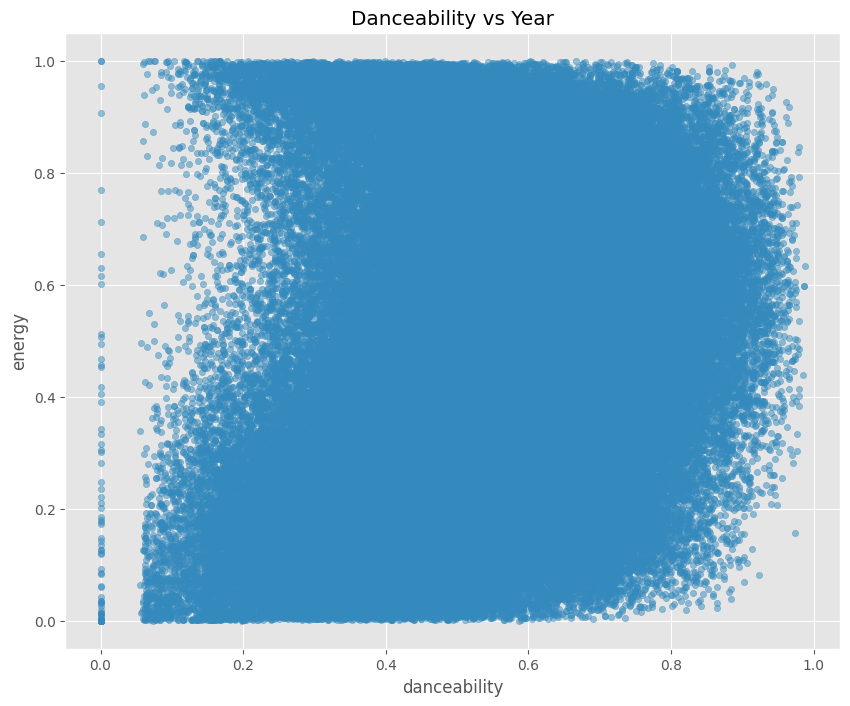

In [205]:
data_df.plot(kind='scatter', x='danceability', y='energy', title='Danceability vs Year', alpha=0.5, figsize=(10, 8))
plt.show()

<Axes: xlabel='acousticness', ylabel='energy'>

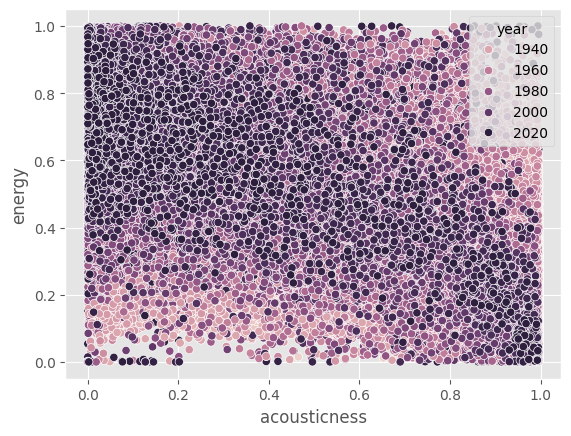

In [206]:
sns.scatterplot(x='acousticness', y='energy', hue='year', data=data_df)

In [5]:
data_df.columns

Index(['valence', 'year', 'acousticness', 'artists', 'danceability',
       'duration_ms', 'energy', 'explicit', 'id', 'instrumentalness', 'key',
       'liveness', 'loudness', 'mode', 'name', 'popularity', 'release_date',
       'speechiness', 'tempo'],
      dtype='object')

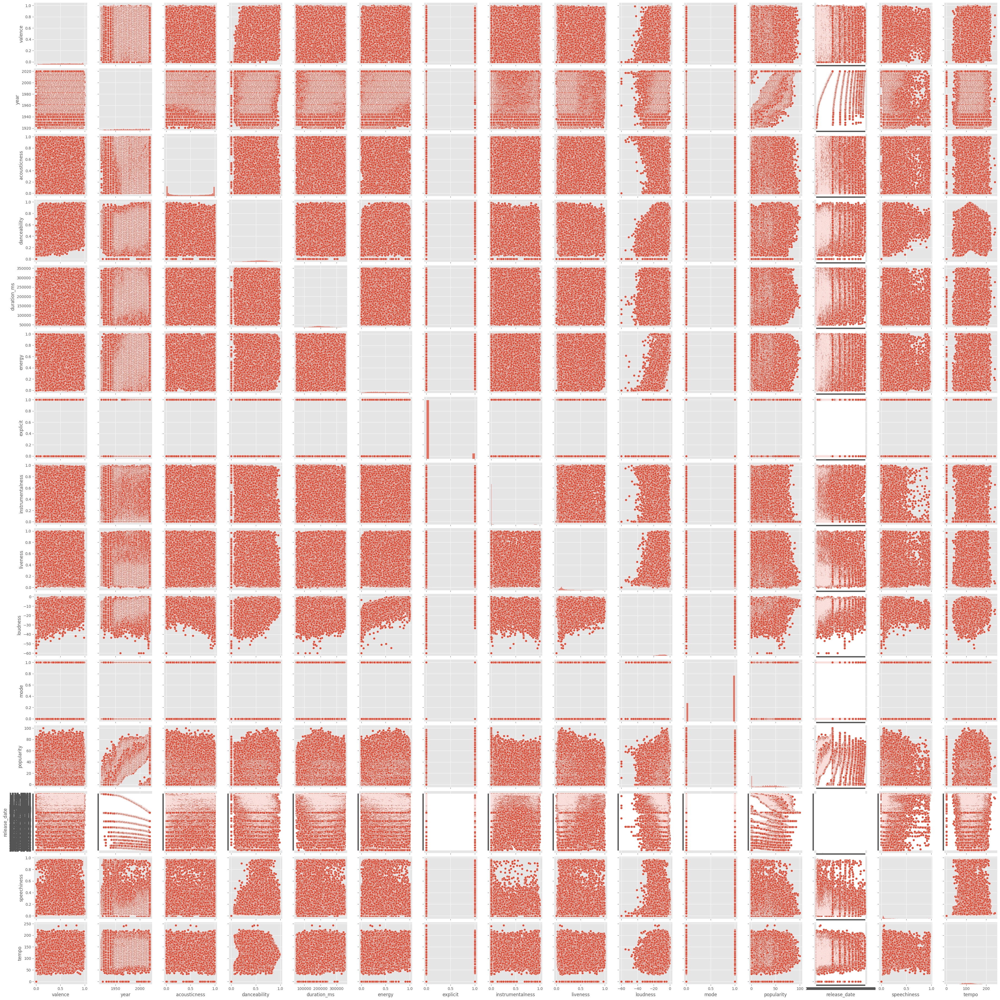

In [211]:
sns.pairplot(data=data_df, vars=['valence', 'year', 'acousticness', 'danceability',
       'duration_ms', 'energy', 'explicit', 'instrumentalness',
       'liveness', 'loudness', 'mode', 'popularity', 'release_date',
       'speechiness', 'tempo'])

In [213]:
df_corr = data_df[['valence', 'acousticness', 'danceability',
       'duration_ms', 'energy', 'explicit', 'instrumentalness',
       'liveness', 'loudness', 'mode', 'popularity',
       'speechiness', 'tempo']].corr()
df_corr

,valence,acousticness,danceability,duration_ms,energy,explicit,instrumentalness,liveness,loudness,mode,popularity,speechiness,tempo
valence,1.000000,-0.164542,0.535981,-0.133482,0.338578,-0.033389,-0.155476,0.006863,0.289803,0.019313,-0.016202,0.036149,0.164580
acousticness,-0.164542,1.000000,-0.255028,-0.271250,-0.747091,-0.252406,0.324261,-0.019066,-0.556539,0.045835,-0.575719,-0.048689,-0.199492
danceability,0.535981,-0.255028,1.000000,-0.010899,0.201897,0.245329,-0.248343,-0.101195,0.261509,-0.048115,0.187095,0.234538,-0.019529
duration_ms,-0.133482,-0.271250,-0.010899,1.000000,0.223933,-0.014525,-0.070765,-0.023110,0.201349,-0.057614,0.288188,-0.189083,0.026384
energy,0.338578,-0.747091,0.201897,0.223933,1.000000,0.129161,-0.267319,0.118193,0.781034,-0.038699,0.486855,-0.080768,0.245763
explicit,-0.033389,-0.252406,0.245329,-0.014525,0.129161,1.000000,-0.136423,0.044913,0.133394,-0.085620,0.187741,0.431391,0.007768
instrumentalness,-0.155476,0.324261,-0.248343,-0.070765,-0.267319,-0.136423,1.000000,-0.042256,-0.394163,-0.037297,-0.287706,-0.110523,-0.094808
liveness,0.006863,-0.019066,-0.101195,-0.023110,0.118193,0.044913,-0.042256,1.000000,0.052441,0.001515,-0.080077,0.136392,0.004950
loudness,0.289803,-0.556539,0.261509,0.201349,0.781034,0.133394,-0.394163,0.052441,1.000000,-0.012305,0.458754,-0.151786,0.201158
mode,0.019313,0.045835,-0.048115,-0.057614,-0.038699,-0.085620,-0.037297,0.001515,-0.012305,1.000000,-0.028822,-0.061146,0.013274


<Axes: >

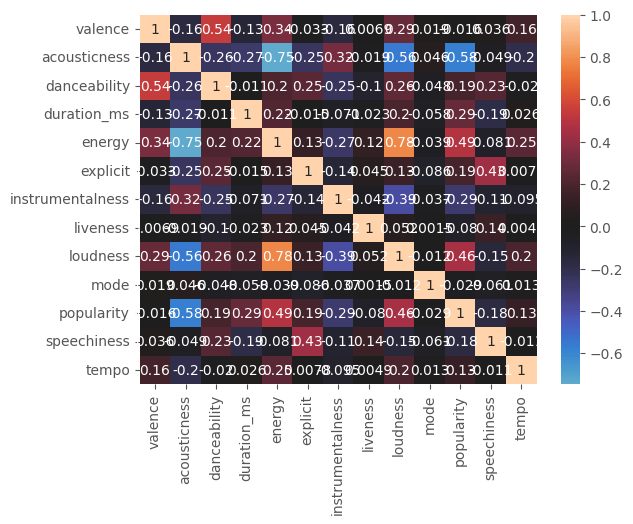

In [215]:
sns.heatmap(df_corr, annot=True, center=0)

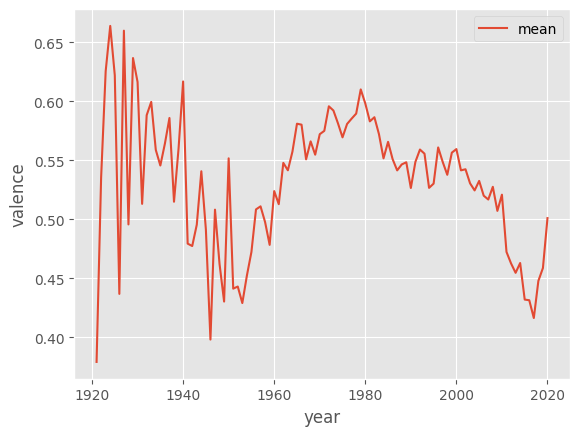

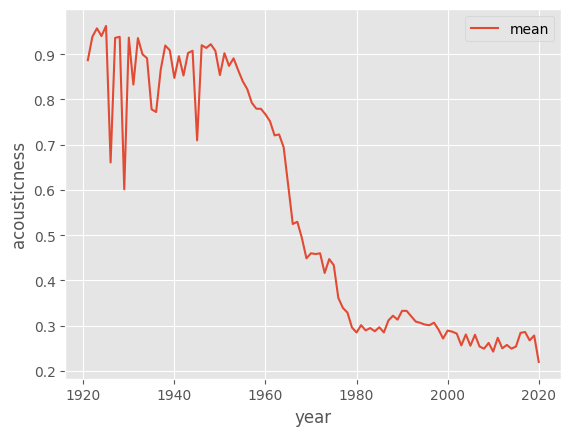

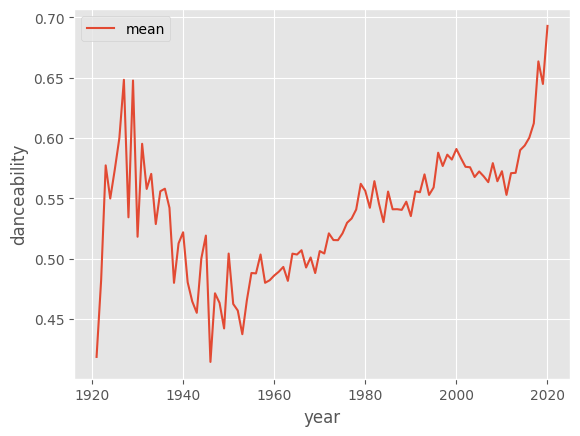

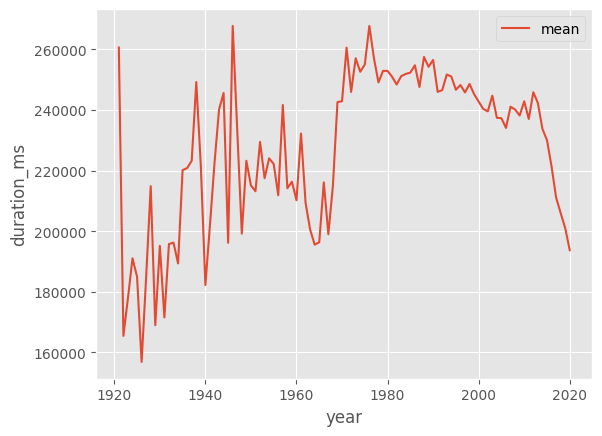

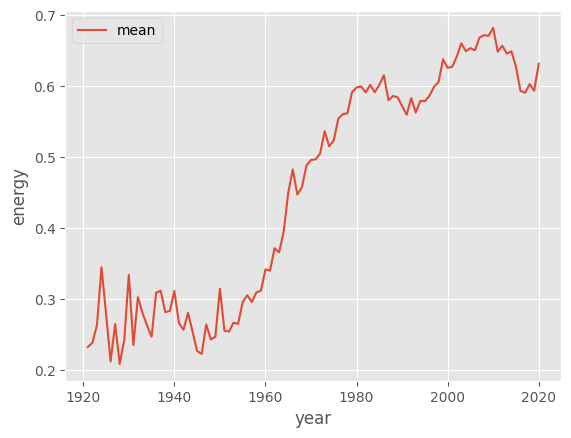

...

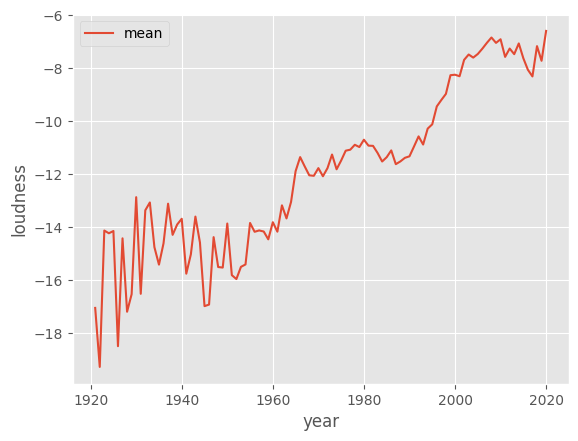

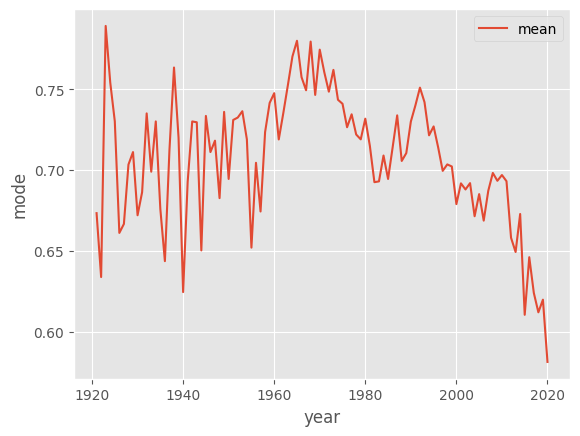

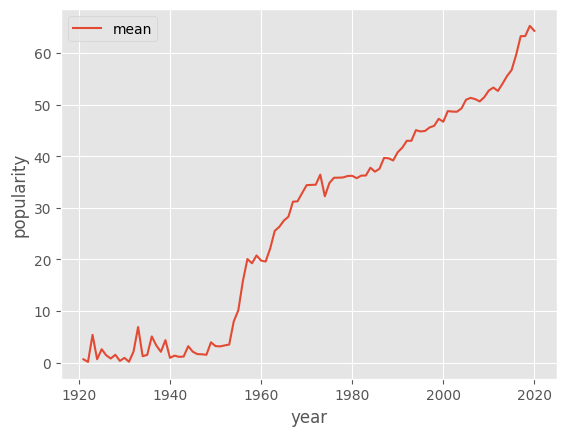

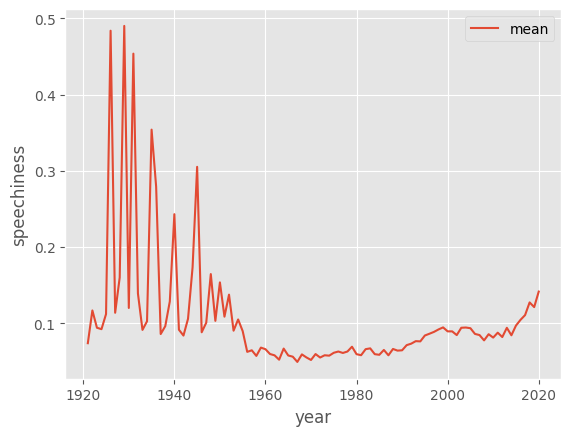

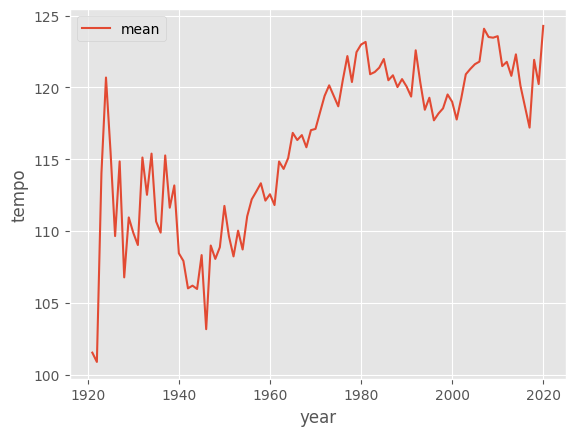

In [15]:
comparion_list = ['valence', 'acousticness', 'danceability',
       'duration_ms', 'energy', 'explicit', 'instrumentalness', 'key',
       'liveness', 'loudness', 'mode', 'popularity',
       'speechiness', 'tempo']

for col in comparion_list:
    ax = data_df.\
        groupby('year')[col].\
        agg(['mean']).\
        plot()
    ax.set_ylabel(col)

# K-means

In [19]:
from sklearn.cluster import KMeans
from sklearn.model_selection import train_test_split

music_features = [
    'valence', 'acousticness', 'danceability',
       'duration_ms', 'energy', 'explicit', 'instrumentalness', 'key',
       'liveness', 'loudness', 'mode', 'popularity',
       'speechiness', 'tempo'
]


X_train, X_test, y_train, y_test = train_test_split(data_df[music_features], data_df["name"], test_size=0.2, random_state=42)

scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

In [26]:
sse = []
for k in range(1, 11):
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(X_train_scaled)
    sse.append(kmeans.inertia_)

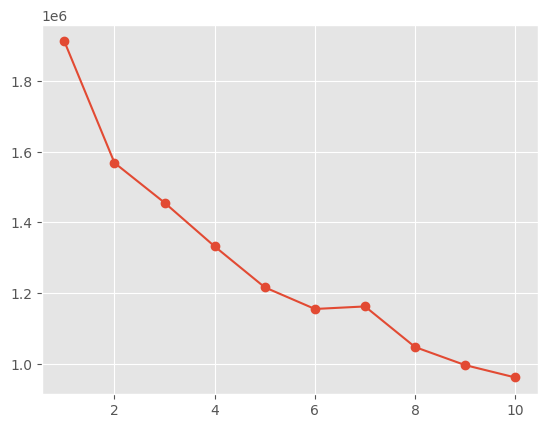

In [29]:
plt.plot(range(1, 11), sse, marker='o')

In [53]:
kmeans = KMeans(n_clusters=4, random_state=42)
kmeans.fit(X_train_scaled)

KMeans(n_clusters=4, random_state=42)

In [54]:
x_train_clusters = kmeans.predict(X_train_scaled)

In [55]:
from sklearn.decomposition import PCA

pca = PCA(n_components=2)
x_train_pca = pca.fit_transform(X_train_scaled)

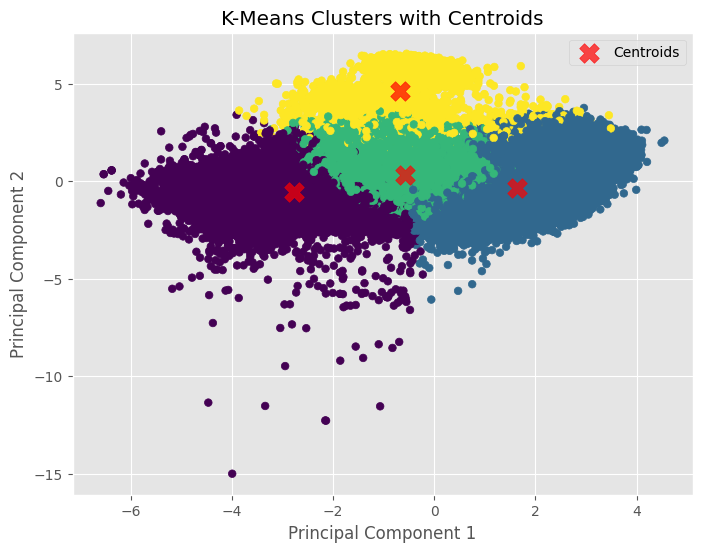

In [56]:
centroids_pca = pca.transform(kmeans.cluster_centers_)

plt.figure(figsize=(8, 6))
plt.scatter(x_train_pca[:, 0], x_train_pca[:, 1], c=x_train_clusters, cmap='viridis', s=30)
plt.scatter(centroids_pca[:, 0], centroids_pca[:, 1], c='red', s=200, alpha=0.7, marker='X', label='Centroids')
plt.title("K-Means Clusters with Centroids")
plt.xlabel("Principal Component 1")
plt.ylabel("Principal Component 2")
plt.legend()
plt.show()

In [70]:
X_test_scaled[0]

array([ 1.4486315 , -0.00476689,  2.02565258,  0.33318601,  0.14309075,
       -0.30315872,  1.93101049, -0.34006916, -0.78920712,  0.77641003,
        0.64379493,  0.11740893, -0.08158195,  0.32523028])

In [66]:
y_test.iloc[0]

'Camby Bolongo'

In [170]:
song_cluster = kmeans.predict([X_test_scaled[1]])[0]
x_same_cluster_songs = X_train_scaled[np.where(x_train_clusters == song_cluster)]
y_same_cluster_songs = y_train[x_train_clusters == song_cluster]


In [171]:
same_cluster_df = pd.DataFrame(x_same_cluster_songs).set_index(y_same_cluster_songs)
same_cluster_df.columns = music_features
same_cluster_df.head()

,valence,acousticness,danceability,duration_ms,energy,explicit,instrumentalness,key,liveness,loudness,mode,popularity,speechiness,tempo
name,,,,,,,,,,,,,,
"La Plaga - Good Golly, Miss Molly [Remasterizado]",1.148492,0.931289,-0.006914,-0.774303,1.775480,-0.303159,-0.452216,-0.340069,3.587706,0.825769,0.643795,-0.570210,-0.366299,-0.804042
Ek Bhola Shikari Aaya,0.776168,1.295606,0.407548,-0.317342,-1.272643,-0.303159,-0.516879,0.228634,-0.577513,0.180415,-1.553290,-1.441194,2.352751,1.883751
That's The Way I Feel About 'Cha,0.711581,0.173403,-0.557638,0.628353,-0.148274,-0.303159,-0.532775,-0.908772,2.082963,0.061848,0.643795,0.300774,-0.374965,-0.340314
No Tengo Lágrimas,0.016322,0.739823,0.759556,-0.555318,0.027292,-0.303159,-0.532918,-0.908772,-0.291441,0.537871,0.643795,0.346615,-0.436241,-1.348164
Soul Vibrations,-0.766320,-0.225485,0.066894,-0.246775,0.273831,-0.303159,2.122511,-0.055718,-0.497413,0.181644,0.643795,0.254933,-0.373727,-0.742646


In [172]:
same_cluster_df.to_numpy()

array([[ 1.14849231,  0.93128902, -0.00691422, ..., -0.57021003,
        -0.36629931, -0.80404176],
       [ 0.77616776,  1.29560623,  0.40754772, ..., -1.44119406,
         2.35275147,  1.88375149],
       [ 0.71158084,  0.17340284, -0.55763763, ...,  0.30077399,
        -0.37496462, -0.34031449],
       ...,
       [ 1.03831464,  1.30358398, -0.51221714, ..., -1.44119406,
         1.04057581, -1.28331351],
       [ 1.4372338 ,  0.12021785,  0.24857602, ..., -0.89109889,
        -0.37125092, -0.84751416],
       [ 0.29366553,  1.26369524, -0.24537178, ..., -0.47852751,
        -0.04506386, -0.1156528 ]], shape=(44650, 14))

In [173]:
from sklearn.metrics.pairwise import cosine_similarity

def get_n_similar_songs(test_song, same_cluster_df, n=5):
    """
    Find n most similar songs to the test song using cosine similarity
    
    Parameters:
    -----------
    test_song : array-like
        The test song features (X_test_scaled[0])
    cluster_songs : array-like
        Songs from the same cluster
    n : int
        Number of similar songs to return
        
    Returns:
    --------
    indices : array
        Indices of the n most similar songs in the cluster_songs array
    similarities : array
        Similarity scores for the n most similar songs
    """
    # Reshape test_song to a 2D array for cosine_similarity function
    test_song_reshaped = test_song.reshape(1, -1)
    
    # Calculate cosine similarity between test_song and all songs in the cluster
    similarities = cosine_similarity(test_song_reshaped, same_cluster_df.to_numpy()).flatten()
    
    # Get indices of songs sorted by similarity (descending order)
    sorted_indices = np.argsort(similarities)[::-1]

    # Return top n similar songs' indices and their similarity scores
    return same_cluster_df.iloc[sorted_indices[:n]].index.to_list(), similarities[sorted_indices[:n]].tolist(), same_cluster_df.iloc[sorted_indices[:n]]

# Find the 5 most similar songs to X_test_scaled[0]
similar_indices, similarity_scores, similar_songs_df = get_n_similar_songs(X_test_scaled[0], same_cluster_df, n=10)


# Print the results
print("Top 5 similar songs indices in the same cluster:", similar_indices)
print("Similarity scores:", similarity_scores)

# If you have song names/IDs in a DataFrame, you can get the actual songs:
# Assuming you have a DataFrame called 'songs_df' with song information
# similar_songs = songs_df.iloc[similar_indices]

Top 5 similar songs indices in the same cluster: ['Para Os Filhos de Abraão', 'Put It Where You Want It', 'El Sofá', 'In Your House - 2006 Remaster', 'In Your House - 2006 Remaster', 'Viva Tirado', "You're Driving Me Crazy", 'jake - keep it together', '月月按', 'Munayé (My Muna)']
Similarity scores: [0.9218539355040701, 0.911135212709285, 0.898403097889216, 0.8967533364888165, 0.8882300655267978, 0.8832929862345672, 0.882592598184515, 0.8793811880854665, 0.8781068156318312, 0.8770987633984308]


In [174]:
pca = PCA(n_components=2)
pca_same_cluster = pca.fit_transform(x_same_cluster_songs)
pca_test_song = pca.transform([X_test_scaled[0]])
pca_similar_songs = pca.transform(similar_songs_df)


/Users/azamani/.pyenv/versions/3.10.4/envs/spotify-music-recommender/lib/python3.10/site-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but PCA was fitted without feature names
  warnings.warn(


Text(0.5, 1.0, 'PCA Projection of Songs')

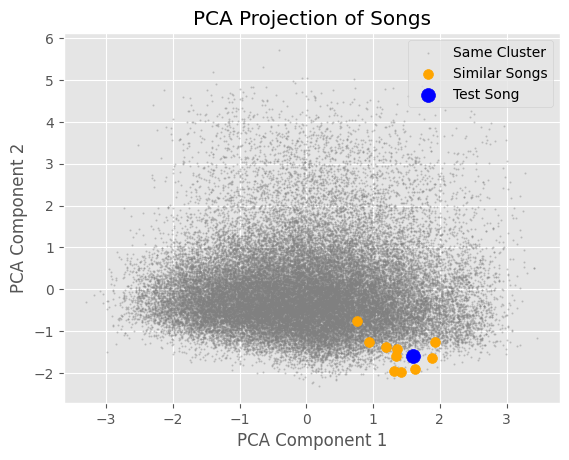

In [179]:
plt.scatter(pca_same_cluster[:, 0], pca_same_cluster[:, 1], s=1, label='Same Cluster', color='gray', alpha=0.3)
plt.scatter(pca_similar_songs[:, 0], pca_similar_songs[:, 1], s=50, label='Similar Songs', color='orange')
plt.scatter(pca_test_song[:, 0], pca_test_song[:, 1], s=100, label='Test Song', color='blue')

plt.legend()
plt.xlabel("PCA Component 1")
plt.ylabel("PCA Component 2")
plt.title("PCA Projection of Songs")


In [16]:
CLIENT_ID = '8a63341f5234405e9403d79f5f869cc9'
CLIENT_SECRET = '55530432bf1a4833a1b6e81d3e254905'
import spotipy
from spotipy.oauth2 import SpotifyClientCredentials
from collections import defaultdict

sp = spotipy.Spotify(auth_manager=SpotifyClientCredentials(client_id=CLIENT_ID,
                                                           client_secret=CLIENT_SECRET))

def find_song(name, year):
    song_data = defaultdict()
    results = sp.search(q= 'track: {} year: {}'.format(name,year), limit=1)
    if results['tracks']['items'] == []:
        return None

    results = results['tracks']['items'][0]
    print(results)
    track_id = results['id']
    audio_features = sp.audio_features(track_id)[0]
    print(audio_features)
    # song_data['name'] = [name]
    # song_data['year'] = [year]
    # song_data['explicit'] = [int(results['explicit'])]
    # song_data['duration_ms'] = [results['duration_ms']]
    # song_data['popularity'] = [results['popularity']]

    # for key, value in audio_features.items():
    #     song_data[key] = value

    # return pd.DataFrame(song_data)


In [18]:
find_song('Turtles All the Way Down', 2014)

HTTP Error for GET to https://api.spotify.com/v1/audio-features/?ids=29m5ZE0vd9nhXmEQnYa0aA with Params: {} returned 403 due to None


{'album': {'album_type': 'album', 'artists': [{'external_urls': {'spotify': 'https://open.spotify.com/artist/1xxXRVpuEm3X3p1QEm61Az'}, 'href': 'https://api.spotify.com/v1/artists/1xxXRVpuEm3X3p1QEm61Az', 'id': '1xxXRVpuEm3X3p1QEm61Az', 'name': 'Khaligraph Jones', 'type': 'artist', 'uri': 'spotify:artist:1xxXRVpuEm3X3p1QEm61Az'}], 'available_markets': ['AR', 'AU', 'AT', 'BE', 'BO', 'BR', 'BG', 'CA', 'CL', 'CO', 'CR', 'CY', 'CZ', 'DK', 'DO', 'DE', 'EC', 'EE', 'SV', 'FI', 'FR', 'GR', 'GT', 'HN', 'HK', 'HU', 'IS', 'IE', 'IT', 'LV', 'LT', 'LU', 'MY', 'MT', 'MX', 'NL', 'NZ', 'NI', 'NO', 'PA', 'PY', 'PE', 'PH', 'PL', 'PT', 'SG', 'SK', 'ES', 'SE', 'CH', 'TW', 'TR', 'UY', 'US', 'GB', 'AD', 'LI', 'MC', 'ID', 'JP', 'TH', 'VN', 'RO', 'IL', 'ZA', 'SA', 'AE', 'BH', 'QA', 'OM', 'KW', 'EG', 'MA', 'DZ', 'TN', 'LB', 'JO', 'PS', 'IN', 'BY', 'KZ', 'MD', 'UA', 'AL', 'BA', 'HR', 'ME', 'MK', 'RS', 'SI', 'KR', 'BD', 'PK', 'LK', 'GH', 'KE', 'NG', 'TZ', 'UG', 'AG', 'AM', 'BS', 'BB', 'BZ', 'BT', 'BW', 'BF', 'CV'

SpotifyException: http status: 403, code: -1 - https://api.spotify.com/v1/audio-features/?ids=29m5ZE0vd9nhXmEQnYa0aA:
 None, reason: None